In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium as folium
import geopy

### Data preview

In [2]:
data = pd.read_excel('ANZ synthesised transaction dataset.xlsx')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12043 entries, 0 to 12042
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   status             12043 non-null  object        
 1   card_present_flag  7717 non-null   float64       
 2   bpay_biller_code   885 non-null    object        
 3   account            12043 non-null  object        
 4   currency           12043 non-null  object        
 5   long_lat           12043 non-null  object        
 6   txn_description    12043 non-null  object        
 7   merchant_id        7717 non-null   object        
 8   merchant_code      883 non-null    float64       
 9   first_name         12043 non-null  object        
 10  balance            12043 non-null  float64       
 11  date               12043 non-null  datetime64[ns]
 12  gender             12043 non-null  object        
 13  age                12043 non-null  int64         
 14  mercha

#### It is clear that there are missing values in some columns.
#### Based on these attributes, it might be interesting to take a look at the distance between merchant location and customer location,
#### the gender difference on amount of transaction, the distribution based on the location, etc.

### Missing values in each column

In [3]:
data.isnull().sum()

status                   0
card_present_flag     4326
bpay_biller_code     11158
account                  0
currency                 0
long_lat                 0
txn_description          0
merchant_id           4326
merchant_code        11160
first_name               0
balance                  0
date                     0
gender                   0
age                      0
merchant_suburb       4326
merchant_state        4326
extraction               0
amount                   0
transaction_id           0
country                  0
customer_id              0
merchant_long_lat     4326
movement                 0
dtype: int64

The dataset has 12043 transactions in total, the majority of columns have complete information.

#### There are 100 customers involved in this dataset.

In [4]:
data.groupby('customer_id').nunique()

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,...,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
customer_id,,,,,,,,,,,,,,,,,,,,,
CUS-1005756958,2,3,1,1,1,1,5,48,2,1,...,1,47,2,73,51,73,1,1,46,2
CUS-1117979751,2,3,1,1,1,1,5,50,2,1,...,1,43,4,99,60,100,1,1,45,2
CUS-1140341822,2,3,2,1,1,1,5,62,2,1,...,1,44,5,80,69,80,1,1,50,2
CUS-1147642491,2,3,1,1,1,1,5,76,2,1,...,1,61,5,104,84,118,1,1,66,2
CUS-1196156254,2,3,1,1,1,1,5,140,2,1,...,1,84,6,245,168,245,1,1,105,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CUS-72755508,2,3,1,1,1,1,4,45,2,1,...,1,30,3,58,47,58,1,1,36,2
CUS-809013380,2,3,1,1,1,1,5,58,2,1,...,1,33,4,124,93,124,1,1,43,2
CUS-860700529,2,3,1,1,1,1,6,200,2,1,...,1,127,6,233,203,233,1,1,149,2


#### There are  91 unique dates in the dataset, suggesting the transaction records for one day are missing.

In [5]:
data.groupby(data['date'].dt.date).size()

date
2018-08-01    137
2018-08-02    152
2018-08-03    157
2018-08-04    118
2018-08-05    100
             ... 
2018-10-27    139
2018-10-28    143
2018-10-29    102
2018-10-30     89
2018-10-31    141
Length: 91, dtype: int64

#### All merchant locations are in Australia, one customer's location is outside of Australia and it should be the wrong location information.

In [6]:
mer_loc_df = pd.DataFrame(data, columns = ['merchant_long_lat'])
mer_loc_df[['Longitude','Latitude']] = mer_loc_df.merchant_long_lat.str.split(" ",expand=True,)
mer_loc_df = mer_loc_df.drop(columns = ['merchant_long_lat'])

In [7]:
mer_loc_df.isnull().sum()

Longitude    4326
Latitude     4326
dtype: int64

In [8]:
mer_loc_df = mer_loc_df.dropna()

In [9]:
map1 = folium.Map(
    zoom_start=12,
)
mer_loc_df.apply(lambda row:folium.CircleMarker(location=[row["Latitude"], row["Longitude"]]).add_to(map1), axis=1)
map1

In [10]:
cus_loc_df = pd.DataFrame(data, columns = ['long_lat'])
cus_loc_df[['Longitude','Latitude']] = cus_loc_df.long_lat.str.split(" ",expand=True,)
cus_loc_df = cus_loc_df.drop(columns = ['long_lat'])

In [12]:
cus_loc_df.isnull().sum()

Longitude    0
Latitude     0
dtype: int64

In [14]:
map2 = folium.Map(
    zoom_start=12,
)
cus_loc_df.apply(lambda row:folium.CircleMarker(location=[row["Latitude"], row["Longitude"]]).add_to(map2), axis=1)
map2

One customer is outside of Australia, somehow he/she is probobly located in Antarctica?

In [16]:
cus_loc_df['Latitude'].max()

'-573.00'

It is suggested to be a wrong location information

### Purchase transaction distribution

Text(0.5, 1.0, 'Purchase trnasaction distribution')

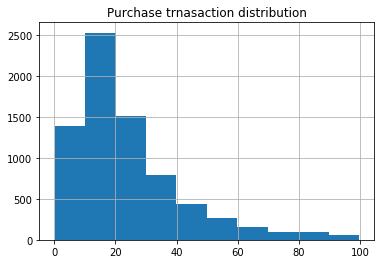

In [17]:
purchase_amount = pd.DataFrame(data[data.merchant_id.notnull()], columns = ['amount'])
purchase_amount_clean = pd.DataFrame(purchase_amount[purchase_amount.amount<100], columns = ['amount'])
purchase_amount_clean.hist()
plt.title('Purchase trnasaction distribution')

### Total Transaction distribution

Text(0.5, 1.0, 'Total transaction distribution')

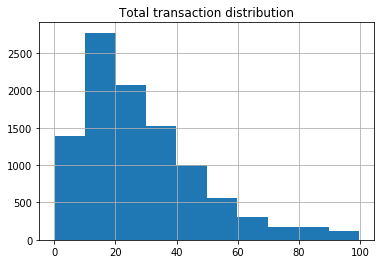

In [18]:
total_amount = pd.DataFrame(data, columns = ['amount'])
total_amount_clean = total_amount[total_amount['amount']<100]
total_amount_clean.hist()
plt.title('Total transaction distribution')

### Transaction insight by month

In [23]:
Augest_df = data[data['date'].astype(str).str.contains('2018-08')]
Sep_df = data[data['date'].astype(str).str.contains('2018-09')]
October_def = data[data['date'].astype(str).str.contains('2018-10')]
aug_amount_avg = Augest_df['amount'].mean()
aug_amount_sum = Augest_df['amount'].sum()
aug_amount_sum, aug_amount_avg
print('In Augest, the total transaction amount is', aug_amount_sum ," and the average amount is", aug_amount_avg)

In Augest, the total transaction amount is 729935.52  and the average amount is 185.12186659903654


In [25]:
sep_amount_avg = Sep_df['amount'].mean()
sep_amount_sum = Sep_df['amount'].sum()
sep_amount_sum, sep_amount_avg
print('In September, the total transaction amount is', sep_amount_sum ," and the average amount is", sep_amount_avg)

In September, the total transaction amount is 730550.2100000001  and the average amount is 182.04590331422853


In [28]:
oct_amount_avg = October_def['amount'].mean()
oct_amount_sum = October_def['amount'].sum()
oct_amount_sum, oct_amount_avg
print('In October, the total transaction amount is', oct_amount_sum ," and the average amount is", oct_amount_avg)

In October, the total transaction amount is 802798.4700000001  and the average amount is 196.42732321996542


### Distance distribution between merchant and customer locations

In [29]:
df_merloc_clean = data[data['merchant_long_lat'].notna()]
mer_cus_loc_df = pd.DataFrame(df_merloc_clean, columns = ['merchant_long_lat','long_lat'])
mer_cus_loc_df[['mer_long','mer_lat']] = mer_cus_loc_df.merchant_long_lat.str.split(" ",expand=True)
mer_cus_loc_df[['cus_long','cus_lat']] = mer_cus_loc_df.long_lat.str.split(" ",expand=True)
mer_cus_loc_df = mer_cus_loc_df.drop(columns = ['merchant_long_lat','long_lat'])

Remove the wrong location row

In [30]:
mer_cus_loc_df = mer_cus_loc_df.loc[mer_cus_loc_df['cus_lat']!=mer_cus_loc_df['cus_lat'].max()]

In [31]:
from geopy.distance import geodesic

In [32]:
def distance_calc (column):
    start = (column['mer_lat'], column['mer_long'])
    stop = (column['cus_lat'], column['cus_long'])
    return geodesic(start, stop).miles

In [33]:
mer_cus_loc_df['distance'] = mer_cus_loc_df.apply (lambda column: distance_calc (column),axis=1)

(array([1050., 1627., 1092.,  534.,  338.,  208.,  143.,   89.,   60.,
          62.]),
 array([ 0.        ,  5.99509556, 11.99019111, 17.98528667, 23.98038222,
        29.97547778, 35.97057333, 41.96566889, 47.96076444, 53.95586   ,
        59.95095556]),
 <a list of 10 Patch objects>)

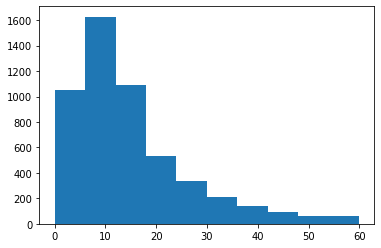

In [34]:
dist = mer_cus_loc_df['distance']
dist_clean = mer_cus_loc_df[mer_cus_loc_df['distance']<60].distance
plt.hist(dist_clean)